This Notebook shall receive a train and a test dataset and with them build a model to predict churn or fail to fufill payment. The train dataset is named treino.csv and the test teste.csv

This Notebook should add a new column with the predictions with the name [inadimplente]. 

The dataset columns follows as:

- ```ìdade```: The age of the customer
- ```numero_de_dependentes```: The number of people dependent on the customer.
- ```salario_mensal```: Monthly salary of the client.
- ```numero_emprestimos_imobiliarios```: Number of real estate loans that the customer has open.
- ```numero_vezes_passou_90_dias```: Number of times the policyholder spent more 90 days overdue.
- ```util_linhas_inseguras```: How much the customer is using in relation to their credit limit, on lines that are not secured by personal assets, such as real estate and cars.
- ```vezes_passou_de_30_59_dias```:  Number of times the customer delayed the payment of a loan, (between 30 and 59 days).
- ```razao_debito```: Ratio between debts and the borrower's equity. debt ratio = Debts / Equity
- ```numero_linhas_crdto_aberto```: Number of loans outstanding by the customer.
- ```number_of_ numero_de_vezes_que_passou_60_89_dias```: Number of times the customer delayed the payment of a loan, (between 60 and 89 days).


sources:

https://machinelearningmastery.com/how-to-score-probability-predictions-in-python/

https://towardsdatascience.com/how-to-develop-a-credit-risk-model-and-scorecard-91335fc01f03

https://github.com/max-fitzpatrick/Credit-scoring-model

https://blogs.sas.com/content/subconsciousmusings/2019/01/18/building-credit-scorecards-using-statistical-methods-and-business-logic/

https://rstudio-pubs-static.s3.amazonaws.com/228103_46b1b4738cf845ad9277e359ebbb8560.html

https://www.kaggle.com/caesarlupum/predictive-model-for-credit-approval?scriptVersionId=46326771-

https://www.openriskmanual.org/wiki/Credit_Scoring_with_Python

https://medium.com/analytics-vidhya/credit-risk-modelling-in-python-3ab4b00f6505

https://machinelearningmastery.com/imbalanced-classification-of-good-and-bad-credit/



### Loading Required libraries

In [1]:
!pip install -r requirements.txt


  Using cached aiohttp-3.7.3-cp36-cp36m-manylinux2014_x86_64.whl (1.3 MB)
  Using cached aniso8601-8.0.0-py2.py3-none-any.whl (43 kB)
  Using cached appdirs-1.4.4-py2.py3-none-any.whl (9.6 kB)
  Using cached astroid-2.4.2-py3-none-any.whl (213 kB)
  Using cached async_timeout-3.0.1-py3-none-any.whl (8.2 kB)
  Using cached attrs-18.1.0-py2.py3-none-any.whl (28 kB)
  Using cached backoff-1.3.2.tar.gz (7.1 kB)
  Using cached beautifulsoup4-4.9.3-py3-none-any.whl (115 kB)
  Using cached cached_property-1.5.2-py2.py3-none-any.whl (7.6 kB)
  Using cached cachetools-4.2.1-py3-none-any.whl (12 kB)
  Using cached cdata-0.1.9-py3-none-any.whl
  Using cached certifi-2020.12.5-py2.py3-none-any.whl (147 kB)
  Using cached cffi-1.14.5-cp36-cp36m-manylinux1_x86_64.whl (401 kB)
  Using cached chardet-4.0.0-py2.py3-none-any.whl (178 kB)
  Using cached ciso8601-2.1.3.tar.gz (15 kB)
  Using cached click-7.1.2-py2.py3-none-any.whl (82 kB)
  Using cached cryptography-3.2.1-cp35-abi3-manylinux2010_x86_64.wh

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Suppress warnings 
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.metrics import roc_auc_score,precision_recall_curve,roc_curve
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix


import itertools
from datetime import datetime
from scipy import interp
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold


pd.set_option('max_columns', 100)

In [3]:
# Training data
train = pd.read_csv('treino.csv')
print('Training data shape: ', train.shape)
train.head()

Training data shape:  (110000, 11)


,inadimplente,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes
0,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


# Exploratory Data Analysis

Most of the time dedicated to a data science project normally is and should alwasys be directed to the EDA. For the current dataset there were pleasant surprises as the dataset di not show a tremeduous amount of discrepancies as the standard data science project usual.

In [4]:
# Test data
test = pd.read_csv('teste.csv')
print('Test data shape: ', test.shape)
test.head()

Test data shape:  (40000, 10)


,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes
0,0.025849,62,0,0.081775,8180.0,3,0,2,0,0.0
1,0.667083,55,0,0.153112,2200.0,3,0,0,0,0.0
2,0.007093,44,0,0.148800,7499.0,20,0,1,0,0.0
3,0.091213,54,0,0.351635,5900.0,15,0,1,1,0.0
4,0.112680,54,0,0.065959,2167.0,3,0,0,0,0.0


In [5]:
df_lgb_ = train.copy()
target = train['inadimplente']
df_lgb = train.drop(['inadimplente'], axis=1)
train_df = train.copy()
x = train.copy()

### Examine the Distribution of the Target Column

There are 6.664545454545454% target values with 1


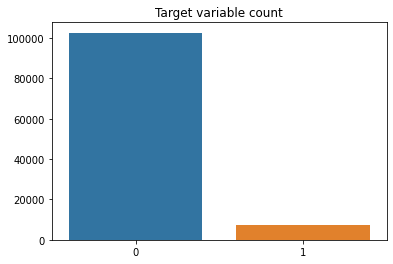

In [6]:
x=train['inadimplente'].value_counts().values
sns.barplot([0,1],x)
plt.title('Target variable count')

print("There are {}% target values with 1".format(100 * train['inadimplente'].value_counts()[1]/train.shape[0]))

The data is unbalanced with respect with the target value.

### Checking missing data in train

number and percentage of missing values in each column.

In [7]:
total = train.isnull().sum().sort_values(ascending = False)
percent = (train.isnull().sum()/train.isnull().count()*100).sort_values(ascending = False)
missing_train_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_train_data.head(10)

,Total,Percent
salario_mensal,21763,19.784545
numero_de_dependentes,2878,2.616364
numero_de_vezes_que_passou_60_89_dias,0,0.000000
numero_emprestimos_imobiliarios,0,0.000000
numero_vezes_passou_90_dias,0,0.000000
numero_linhas_crdto_aberto,0,0.000000
razao_debito,0,0.000000
vezes_passou_de_30_59_dias,0,0.000000
idade,0,0.000000
util_linhas_inseguras,0,0.000000


missing values: salario_mensal	```19.78%``` and numero_de_dependentes ```2.61%```

### Column Types

In [8]:
train.dtypes.value_counts()

int64      7
float64    4
dtype: int64

numeric variables 7 ```int64``` and 4 ```float64``` (which can be either discrete or continuous).

### Duplicate values
Let's now check how many duplicate values exists per columns.

In [9]:
features = train.columns.values[1:11]
unique_max_train = []
unique_max_test = []
for feature in features:
    values = train[feature].value_counts()
    unique_max_train.append([feature, values.max(), values.idxmax()])
    values = test[feature].value_counts()
    unique_max_test.append([feature, values.max(), values.idxmax()])


In [10]:
np.transpose((pd.DataFrame(unique_max_train, columns=['Feature', 'Max duplicates', 'Value'])).\
            sort_values(by = 'Max duplicates', ascending=False).head(10))

,8,6,2,9,7,5,0,3,1,4
Feature,numero_de_vezes_que_passou_60_89_dias,numero_vezes_passou_90_dias,vezes_passou_de_30_59_dias,numero_de_dependentes,numero_emprestimos_imobiliarios,numero_linhas_crdto_aberto,util_linhas_inseguras,razao_debito,idade,salario_mensal
Max duplicates,104466,103836,92469,63652,41159,9988,7983,3030,2794,2035
Value,0,0,0,0,0,6,0,0,48,5000


In [11]:
np.transpose((pd.DataFrame(unique_max_test, columns=['Feature', 'Max duplicates', 'Value'])).\
            sort_values(by = 'Max duplicates', ascending=False).head(10))

,8,6,2,9,7,5,0,3,1,4
Feature,numero_de_vezes_que_passou_60_89_dias,numero_vezes_passou_90_dias,vezes_passou_de_30_59_dias,numero_de_dependentes,numero_emprestimos_imobiliarios,numero_linhas_crdto_aberto,util_linhas_inseguras,razao_debito,idade,salario_mensal
Max duplicates,37930,37826,33549,23250,15029,3626,2895,1083,1049,722
Value,0,0,0,0,0,6,0,0,49,5000


Same columns in train and test set have very close number of duplicates of same or very close values. 
This is an interesting pattern that we might be able to use in the future

### Correlations

The correlation coefficient is not the greatest method to represent "relevance" of a feature, but it does give us an idea of possible relationships within the data. Some general interpretations of the absolute value of the correlation coefficent are:

- .00-.19 “very weak”
- .20-.39 “weak”
- .40-.59 “moderate”
- .60-.79 “strong”
- .80-1.0 “very strong”

In [12]:
# Find correlations with the target and sort
correlations = train.corr()['inadimplente'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(5))
print('\nMost Negative Correlations:\n', correlations.head(5))

Most Positive Correlations:
 numero_de_dependentes                    0.043079
numero_de_vezes_que_passou_60_89_dias    0.101536
numero_vezes_passou_90_dias              0.116023
vezes_passou_de_30_59_dias               0.124546
inadimplente                             1.000000
Name: inadimplente, dtype: float64

Most Negative Correlations:
 idade                             -0.114281
numero_linhas_crdto_aberto        -0.029332
salario_mensal                    -0.020271
numero_emprestimos_imobiliarios   -0.008144
razao_debito                      -0.006534
Name: inadimplente, dtype: float64


more significant correlations: the **vezes_passou_de_30_59_dias** is the most positive correlation;


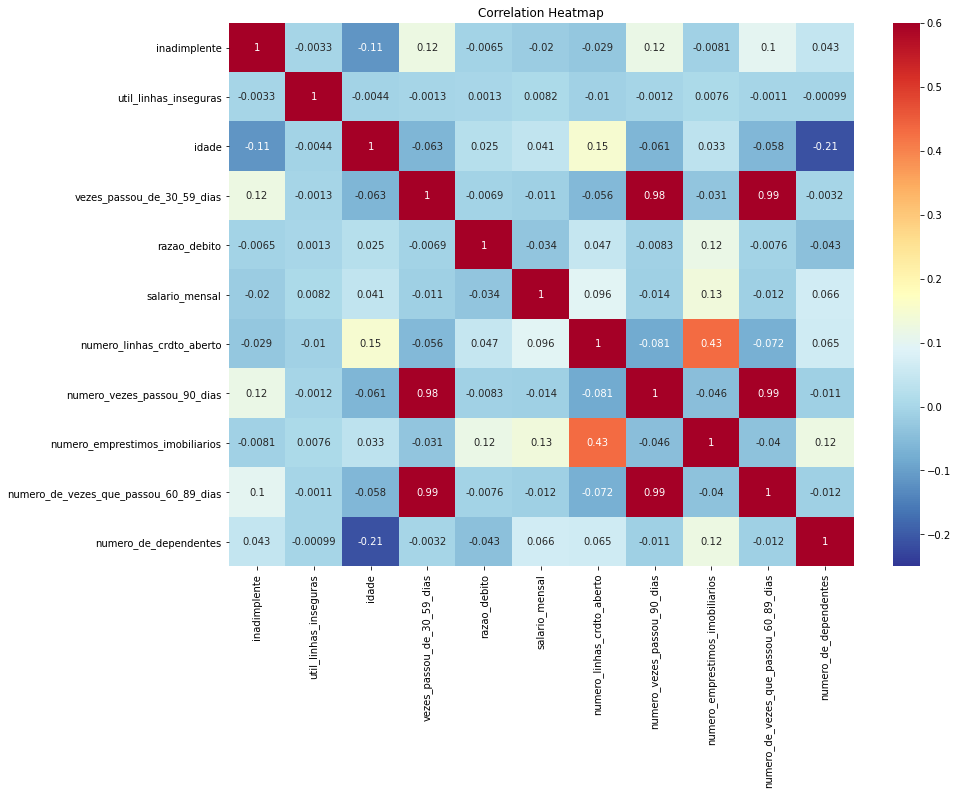

In [13]:
corr_train = train.corr()
plt.figure(figsize = (14, 10))
# Heatmap of correlations
sns.heatmap(corr_train, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

```numero_vezes_passou_90_dias```, ```vezes_passou_de_30_59_dias```, ````numero_de_vezes_que_passou_60_89_dias``` are very correlated. expected correlation ;)

```numero_emprestimos_imobiliarios``` has medium correlation with ```salario_mensal:``` indicate that people with a high salary have more loans.

##### Age informative plots

min age 0 max age 109
age <20 10, age >99 1


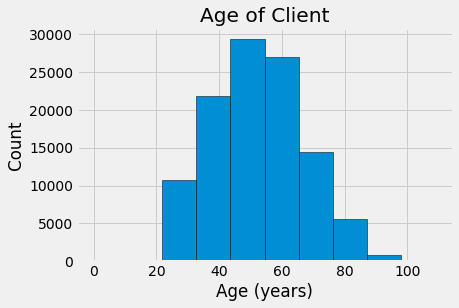

In [14]:
plt.style.use('fivethirtyeight')
# Plot the distribution of ages in years
plt.hist(train['idade'], edgecolor = 'k')
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');
print('min age {} max age {}'.format(train['idade'].min(), train['idade'].max()))
print('age <20 {}, age >99 {}'.format(len(train[train['idade']>99]),len(train[train['idade']<20])))

We have some inconsisent values. age equal 0 for example. We need drop these rows.

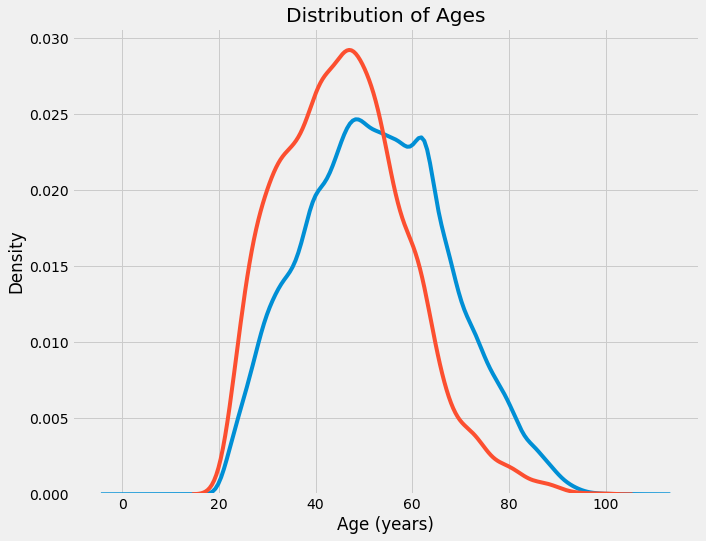

In [15]:
plt.figure(figsize = (10, 8))
# KDE plot of loans that were repaid on time
sns.kdeplot(train.loc[train['inadimplente'] == 0, 'idade'], label = 'target == 0')
# KDE plot of loans which were not repaid on time
sns.kdeplot(train.loc[train['inadimplente'] == 1, 'idade'], label = 'target == 1')
# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

#### Average failure to repay loans by age bracket.

In [16]:
# Age information into a separate dataframe
age_data = train[['inadimplente', 'idade']]
# Bin the age data
age_data['age_binned'] = pd.cut(age_data['idade'], bins = np.linspace(20, 60, num = 6))
age_data.head(10)

/home/tik/chal/dataminer/venv/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,inadimplente,idade,age_binned
0,1,45,"(44.0, 52.0]"
1,0,40,"(36.0, 44.0]"
2,0,38,"(36.0, 44.0]"
3,0,30,"(28.0, 36.0]"
4,0,49,"(44.0, 52.0]"
5,0,74,NaN
6,0,57,"(52.0, 60.0]"
7,0,39,"(36.0, 44.0]"
8,0,27,"(20.0, 28.0]"
9,0,57,"(52.0, 60.0]"


In [17]:
# Group by the bin and calculate averages
age_groups  = age_data.groupby('age_binned').mean()
age_groups

,inadimplente,idade
age_binned,,
"(20.0, 28.0]",0.124952,25.604571
"(28.0, 36.0]",0.103157,32.699700
"(36.0, 44.0]",0.086656,40.685306
"(44.0, 52.0]",0.079120,48.507315
"(52.0, 60.0]",0.058065,56.418215


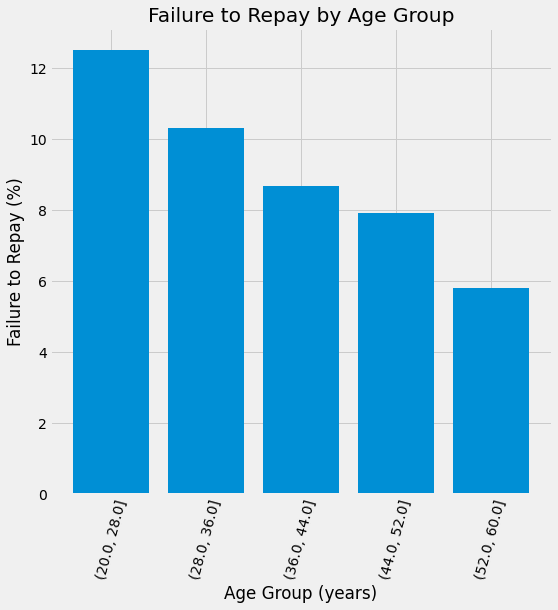

In [18]:
plt.figure(figsize = (8, 8))
# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['inadimplente'])
# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

There is a clear trend: younger applicants are more likely to not repay the loan! The rate of failure to repay is above 10% for the youngest two age groups 20-28, 28-36.


This is information that could be directly used by the bank: because younger clients are less likely to repay the loan, maybe they should be provided with more guidance or financial planning tips. This does not mean the bank should discriminate against younger clients, but it would be smart to take precautionary measures to help younger clients pay on time.

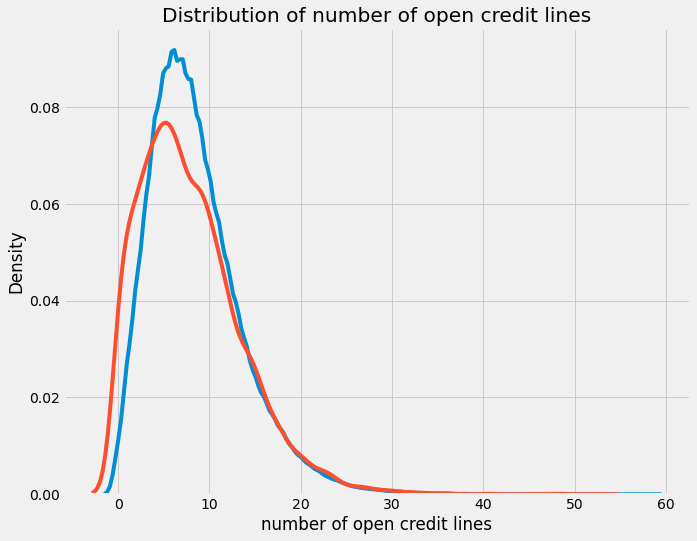

In [19]:
plt.figure(figsize = (10, 8))
sns.kdeplot(train.loc[train['inadimplente'] == 0, 'numero_linhas_crdto_aberto'], label = 'target == 0')
sns.kdeplot(train.loc[train['inadimplente'] == 1, 'numero_linhas_crdto_aberto'], label = 'target == 1')
plt.xlabel('number of open credit lines'); plt.ylabel('Density'); plt.title('Distribution of number of open credit lines');

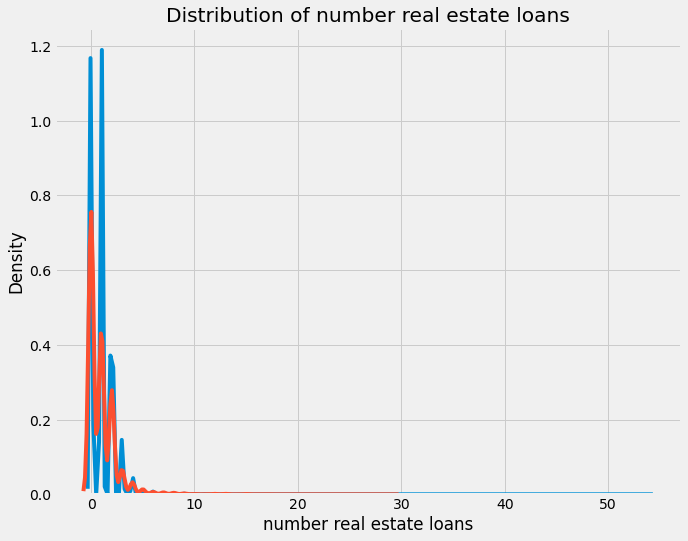

In [20]:
plt.figure(figsize = (10, 8))
sns.kdeplot(train.loc[train['inadimplente'] == 0, 'numero_emprestimos_imobiliarios'], label = 'target == 0')
sns.kdeplot(train.loc[train['inadimplente'] == 1, 'numero_emprestimos_imobiliarios'], label = 'target == 1')
plt.xlabel('number real estate loans'); plt.ylabel('Density'); plt.title('Distribution of number real estate loans');

### Train Test Distribution Analysis

In [21]:
def plot_dist_col(column, train, test):
    '''plot dist curves for train and test  data for the given column name'''
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.distplot(train[column].dropna(), color='green', ax=ax).set_title(column, fontsize=10)
    sns.distplot(test[column].dropna(), color='purple', ax=ax).set_title(column, fontsize=10)
    plt.xlabel(column, fontsize=12)
    plt.legend(['train', 'test'])
    plt.show()

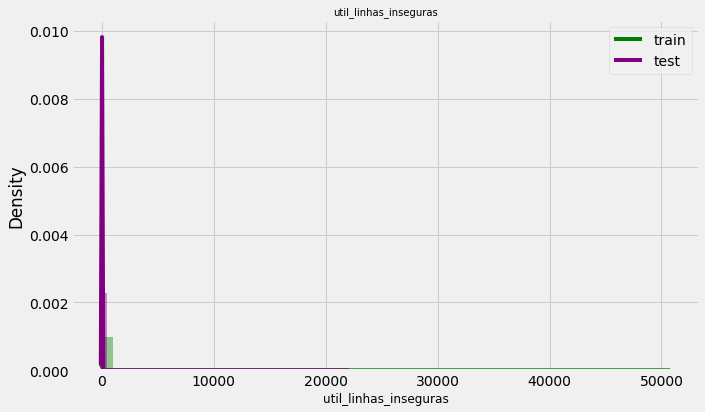

In [22]:
plot_dist_col('util_linhas_inseguras', train, test)    

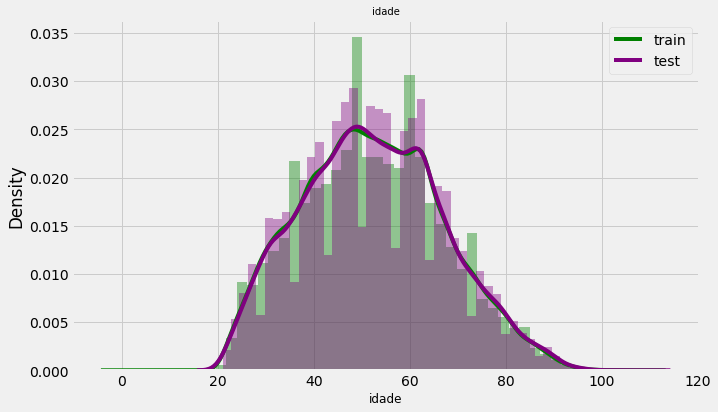

In [23]:
plot_dist_col('idade', train, test) 

In [24]:
test.dtypes

util_linhas_inseguras                    float64
idade                                      int64
vezes_passou_de_30_59_dias                 int64
razao_debito                             float64
salario_mensal                           float64
numero_linhas_crdto_aberto                 int64
numero_vezes_passou_90_dias                int64
numero_emprestimos_imobiliarios            int64
numero_de_vezes_que_passou_60_89_dias      int64
numero_de_dependentes                    float64
dtype: object

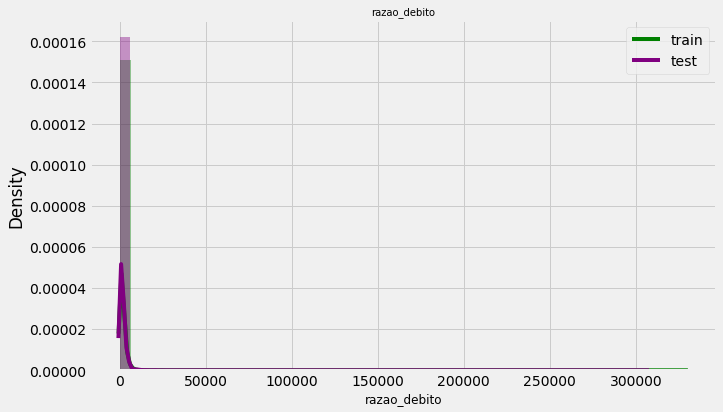

In [25]:
plot_dist_col('razao_debito', train, test) 

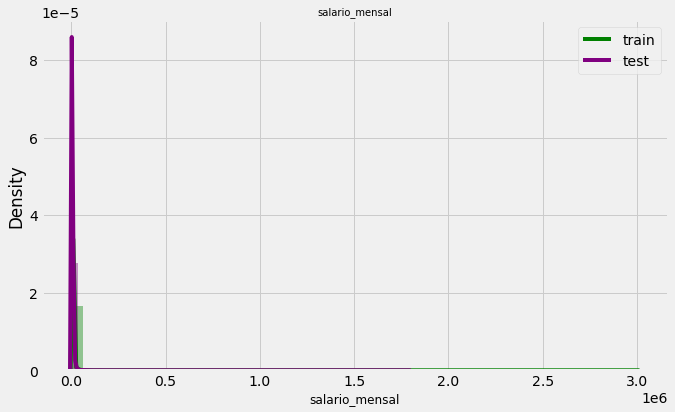

In [26]:

plot_dist_col('salario_mensal', train, test)

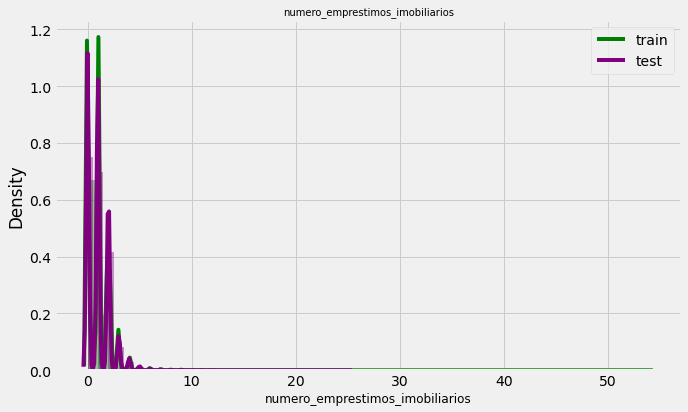

In [27]:
plot_dist_col('numero_emprestimos_imobiliarios', train, test)

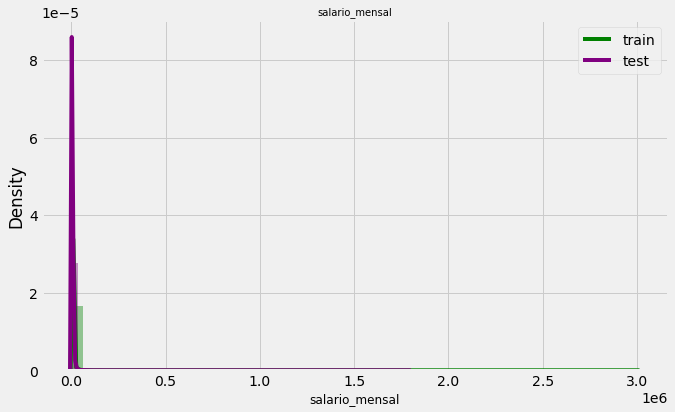

In [28]:
plot_dist_col('salario_mensal', train, test)

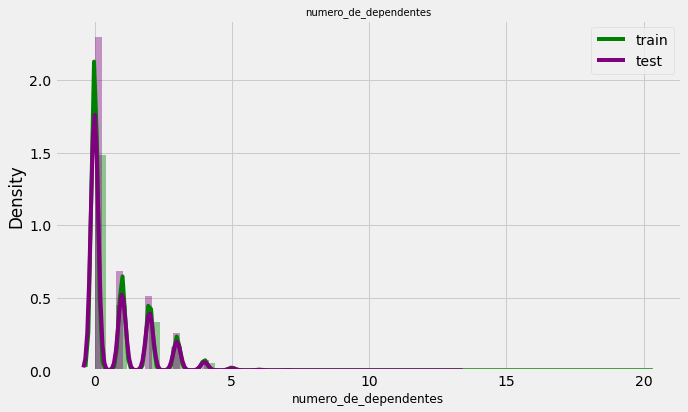

In [29]:
plot_dist_col('numero_de_dependentes', train, test) 

In general we have similar distribution in dataset, but **util_linhas_inseguras**, **numero_emprestimos_imobiliarios**,**salario_mensal**  have higher values in test data.

# Baseline

In [30]:
train = train.drop(columns = ['inadimplente'])
# Feature names
features = list(train.columns)
# Median imputation of missing values
imputer = SimpleImputer(strategy = 'median')
# Scale each feature to 0-1
scaler = MinMaxScaler(feature_range = (0, 1))

# Fit on the training data
imputer.fit(train)
# Transform both training and testing data
train = imputer.transform(train)
test = imputer.transform(test)
# Repeat with the scaler
scaler.fit(train)
train = scaler.transform(train)
test = scaler.transform(test)

print('Training data shape: ', train.shape)
print('Testing data shape: ', test.shape)

Training data shape:  (110000, 10)
Testing data shape:  (40000, 10)


### Logistic Regression

In [31]:
# Confusion matrix 
def plot_confusion_matrix(cm, classes,
                          normalize = False,
                          title = 'Confusion matrix"',
                          cmap = plt.cm.Blues) :
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 0)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])) :
        plt.text(j, i, cm[i, j],
                 horizontalalignment = 'center',
                 color = 'white' if cm[i, j] > thresh else 'black')

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [32]:
def auc_score(y_true, y_pred):
    """
    Calculates the Area Under ROC Curve (AUC)
    """
    return roc_auc_score(y_true, y_pred)
def plot_curve(y_true_train, y_pred_train, y_true_val, y_pred_val, model_name):
    """
    Plots the ROC Curve given predictions and labels
    """
    fpr_train, tpr_train, _ = roc_curve(y_true_train, y_pred_train, pos_label=1)
    fpr_val, tpr_val, _ = roc_curve(y_true_val, y_pred_val, pos_label=1)
    plt.figure(figsize=(8, 8))
    plt.plot(fpr_train, tpr_train, color='black',
             lw=2, label=f"ROC train curve (AUC = {round(roc_auc_score(y_true_train, y_pred_train), 4)})")
    plt.plot(fpr_val, tpr_val, color='darkorange',
             lw=2, label=f"ROC validation curve (AUC = {round(roc_auc_score(y_true_val, y_pred_val), 4)})")
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.title(f'ROC Plot for {model_name}', weight="bold", fontsize=20)
    plt.legend(loc="lower right", fontsize=16)
def plot_pre_curve(y_test,probs):
    precision, recall, thresholds = precision_recall_curve(y_test, probs)
    plt.plot([0, 1], [0.5, 0.5], linestyle='--')
    # plot the precision-recall curve for the model
    plt.plot(recall, precision, marker='.')
    plt.title("precision recall curve")
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    # show the plot
    plt.show()

In [33]:
X_train, X_val, y_train, y_val = train_test_split(train, target,
                                                  test_size=0.30, 
                                                  random_state=2020, 
                                                  stratify=target,
                                                  shuffle=True
                                                  )

In [34]:
# Make the model with the specified regularization parameter
log_reg = LogisticRegression(C = 0.0001)
# Train on the training data
log_reg.fit(X_train, y_train)

LogisticRegression(C=0.0001)

In [35]:
# Get score on training set and validation set for Logistic Regression
train_preds = log_reg.predict_proba(X_train)[:, 1]
val_preds = log_reg.predict_proba(X_val)[:, 1]
train_score = auc_score(y_train, train_preds)
val_score = auc_score(y_val, val_preds)

##### Evaluation Logistic Regression ROC_AUC

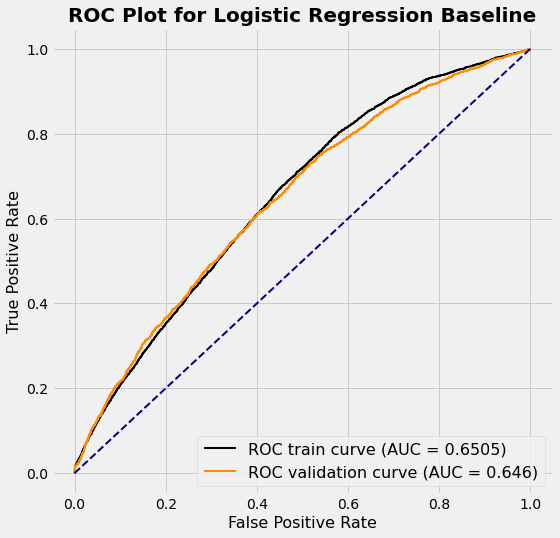

In [36]:
# Plot ROC curve
plot_curve(y_train, train_preds, y_val, val_preds, "Logistic Regression Baseline")

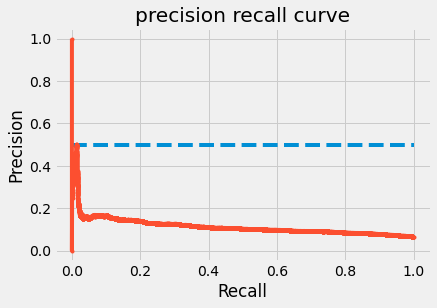

In [37]:
plot_pre_curve(y_val ,val_preds)

#### Classification report train

In [38]:
train_cm = confusion_matrix(y_train,train_preds.round())
print('Confusion matrix: \n',train_cm)
print('Classification report: \n',classification_report(y_train, train_preds.round()))

Confusion matrix: 
 [[71868     0]
 [ 5132     0]]
Classification report: 
               precision    recall  f1-score   support

           0       0.93      1.00      0.97     71868
           1       0.00      0.00      0.00      5132

    accuracy                           0.93     77000
   macro avg       0.47      0.50      0.48     77000
weighted avg       0.87      0.93      0.90     77000



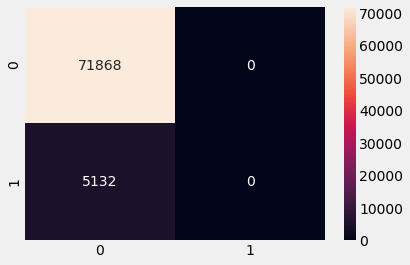

In [39]:
# visualize with seaborn library
sns.heatmap(train_cm,annot=True,fmt="d") 
plt.show()

### Improved Model: Random Forest

In [40]:

# Make the random forest classifier
random_forest = RandomForestClassifier(n_estimators = 100, random_state = 2020, verbose = 1, n_jobs = -1)
# Train on the training data
random_forest.fit(X_train,y_train)
    # Extract feature importances
feature_importance_values = random_forest.feature_importances_
feature_importances = pd.DataFrame({'feature': features, 'importance': feature_importance_values})

# Get score on training set and validation set for random forest
train_preds = random_forest.predict_proba(X_train)[:, 1]
val_preds = random_forest.predict_proba(X_val)[:, 1]
train_score = auc_score(y_train, train_preds)
val_score = auc_score(y_val, val_preds)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   22.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.7s finished


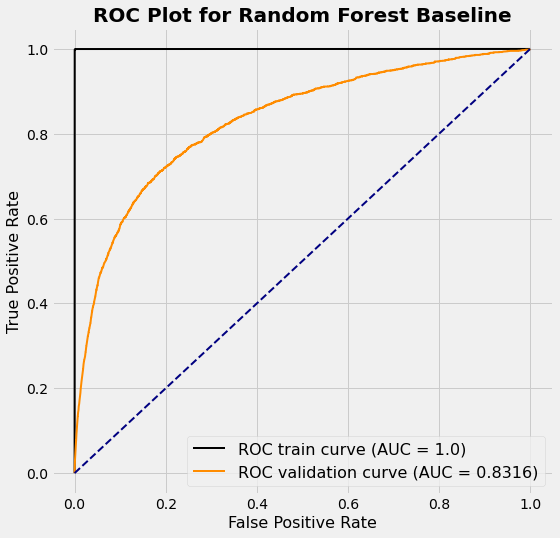

In [41]:
# Plot ROC curve
plot_curve(y_train, train_preds, y_val, val_preds, "Random Forest Baseline")

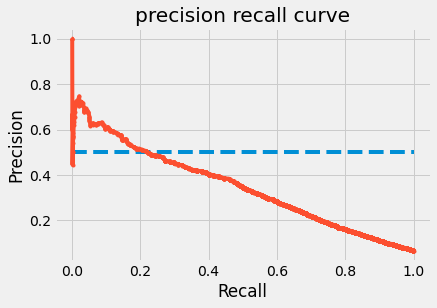

In [42]:
plot_pre_curve(y_val ,val_preds)

#### Classification report train

In [43]:
train_cm = confusion_matrix(y_train,train_preds.round())
print('Confusion matrix: \n',train_cm)
print('Classification report: \n',classification_report(y_train, train_preds.round()))

Confusion matrix: 
 [[71863     5]
 [   48  5084]]
Classification report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     71868
           1       1.00      0.99      0.99      5132

    accuracy                           1.00     77000
   macro avg       1.00      1.00      1.00     77000
weighted avg       1.00      1.00      1.00     77000



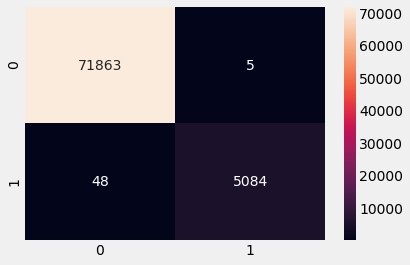

In [44]:
# visualize with seaborn library
sns.heatmap(train_cm,annot=True,fmt="d") 
plt.show()

This is great, the model is accurate! just 5 FP of 71863, 48 FN of 5084.

# Feature Selection

In [45]:
# Lgbm
!pip install lightgbm
import lightgbm as lgb

You should consider upgrading via the '/home/tik/chal/dataminer/venv/bin/python -m pip install --upgrade pip' command.


In [46]:
# Initialize an empty array to hold feature importances
feature_importances = np.zeros(df_lgb.shape[1])
train_weight = 1-y_train.replace(y_train.value_counts()/len(y_train))
positive_weight = train_weight[y_train==1].values[0]
# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary', boosting_type = 'goss', n_estimators = 5000, class_weight = 'balanced', scale_pos_weight= positive_weight)
    
# Train using early stopping
model.fit(X_train, y_train, early_stopping_rounds=100, eval_set = [(X_val, y_val)], 
              eval_metric = 'auc', verbose = 200)
    
    # Record the feature importances
feature_importances += model.feature_importances_

Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[44]	valid_0's auc: 0.859312	valid_0's binary_logloss: 0.423824


In [47]:
# Get score on training set and validation set for random forest
train_preds = model.predict_proba(X_train)[:, 1]
val_preds = model.predict_proba(X_val)[:, 1]
train_score = auc_score(y_train, train_preds)
val_score = auc_score(y_val, val_preds)

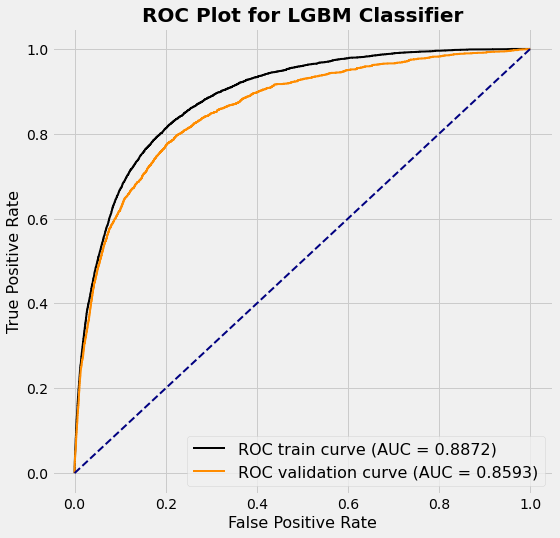

In [48]:
# Plot ROC curve
plot_curve(y_train, train_preds, y_val, val_preds, "LGBM Classifier")

classification report

In [49]:
train_cm = confusion_matrix(y_train,train_preds.round())
print('Confusion matrix: \n',train_cm)
print('Classification report: \n',classification_report(y_train, train_preds.round()))

Confusion matrix: 
 [[58368 13500]
 [ 1027  4105]]
Classification report: 
               precision    recall  f1-score   support

           0       0.98      0.81      0.89     71868
           1       0.23      0.80      0.36      5132

    accuracy                           0.81     77000
   macro avg       0.61      0.81      0.63     77000
weighted avg       0.93      0.81      0.85     77000



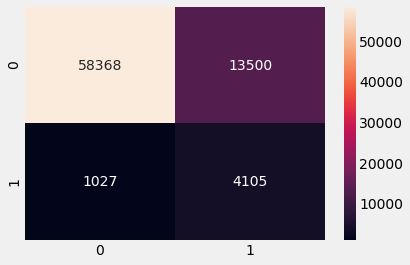

In [50]:
# visualize with seaborn library
sns.heatmap(train_cm,annot=True,fmt="d") 
plt.show()

Average feature importances!

In [51]:
# Make sure to average feature importances! 
feature_importances = feature_importances / 2
feature_importances = pd.DataFrame({'feature': list(df_lgb.columns), 'importance': feature_importances}).sort_values('importance', ascending = False)
feature_importances.head()

,feature,importance
3,razao_debito,118.0
0,util_linhas_inseguras,116.5
1,idade,97.0
4,salario_mensal,83.0
5,numero_linhas_crdto_aberto,64.0


**razao_debito** and **util_linhas_inseguras** are the most important features for our model !

Find the features with zero importance

In [52]:
# Find the features with zero importance
zero_features = list(feature_importances[feature_importances['importance'] == 0.0]['feature'])
print('There are %d features with 0.0 importance' % len(zero_features))
feature_importances.tail()

There are 0 features with 0.0 importance


,feature,importance
2,vezes_passou_de_30_59_dias,46.5
7,numero_emprestimos_imobiliarios,41.5
6,numero_vezes_passou_90_dias,39.5
8,numero_de_vezes_que_passou_60_89_dias,39.5
9,numero_de_dependentes,14.5


we not have features that have zero importance. Nice !


In [53]:
def plot_feature_importances(df, threshold = 0.9):
    """
    Plots 10 most important features and the cumulative importance of features.
    Prints the number of features needed to reach threshold cumulative importance.
    
    Parameters
    --------
    df : dataframe
        Dataframe of feature importances. Columns must be feature and importance
    threshold : float, default = 0.9
        Threshold for prining information about cumulative importances
        
    Return
    --------
    df : dataframe
        Dataframe ordered by feature importances with a normalized column (sums to 1)
        and a cumulative importance column
    
    """
    
    plt.rcParams['font.size'] = 15
    
    # Sort features according to importance
    df = df.sort_values('importance', ascending = False).reset_index()
    
    # Normalize the feature importances to add up to one
    df['importance_normalized'] = df['importance'] / df['importance'].sum()
    df['cumulative_importance'] = np.cumsum(df['importance_normalized'])

    # Make a horizontal bar chart of feature importances
    plt.figure(figsize = (10, 6))
    ax = plt.subplot()
    
    # Need to reverse the index to plot most important on top
    ax.barh(list(reversed(list(df.index[:10]))), 
            df['importance_normalized'].head(10), 
            align = 'center', edgecolor = 'k')
    
    # Set the yticks and labels
    ax.set_yticks(list(reversed(list(df.index[:10]))))
    ax.set_yticklabels(df['feature'].head(10))
    
    # Plot labeling
    plt.xlabel('Normalized Importance'); plt.title('Feature Importances')
    plt.show()
    
    # Cumulative importance plot
    plt.figure(figsize = (8, 6))
    plt.plot(list(range(len(df))), df['cumulative_importance'], 'r-')
    plt.xlabel('Number of Features'); plt.ylabel('Cumulative Importance'); 
    plt.title('Cumulative Feature Importance');
    plt.show();
    
    importance_index = np.min(np.where(df['cumulative_importance'] > threshold))
    print('%d features required for %0.2f of cumulative importance' % (importance_index + 1, threshold))
    
    return df

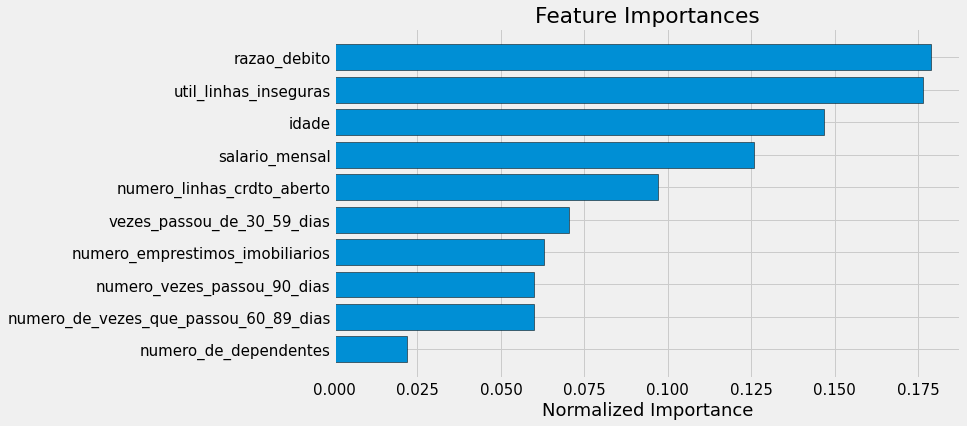

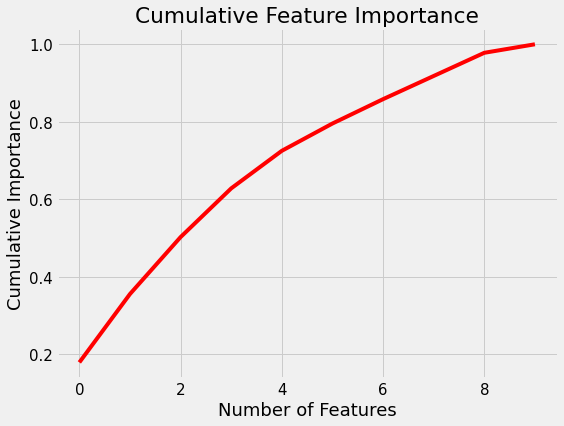

8 features required for 0.90 of cumulative importance


In [54]:
norm_feature_importances = plot_feature_importances(feature_importances)

# Modeling

In [55]:
import itertools
from scipy import interp
def gradient_boosting_model(params, folds, test_df, model='LGB',stack = False):    
    print(str(model)+' modeling...')
    start_time = timer(None)
    plt.rcParams["axes.grid"] = True
    nfold = folds
    skf = StratifiedKFold(n_splits=nfold, shuffle=True, random_state=44400 )

    oof = np.zeros(len(train_df))
    mean_fpr = np.linspace(0,1,100)
    cms= []
    tprs = []
    aucs = []
    y_real = []
    y_proba = []
    recalls = []
    roc_aucs = []
    f1_scores = []
    accuracies = []
    precisions = []
    feature_importance_df = pd.DataFrame()
    predictions = np.zeros(len(test_df))

    i = 1
    for train_idx, valid_idx in skf.split(train_df, train_df['inadimplente'].values):
        print("\nfold {}".format(i))
        
        if model == 'LGB':
        
            trn_data = lgb.Dataset(train_df.iloc[train_idx][features].values,
                                   label=train_df.iloc[train_idx]['inadimplente'].values
                                   )
            val_data = lgb.Dataset(train_df.iloc[valid_idx][features].values,
                                   label=train_df.iloc[valid_idx]['inadimplente'].values
                                   )   

            clf = lgb.train(param_lgb, trn_data, num_boost_round=1000,  valid_sets = [trn_data, val_data], verbose_eval=800, early_stopping_rounds = 10000)
            oof[valid_idx] = clf.predict(train_df.iloc[valid_idx][features].values) 
  
            predictions += clf.predict(test_df[features], num_iteration=clf.best_iteration) / skf.n_splits
    
        if model == 'XGB':

            trn_data = xgb.DMatrix(train_df.iloc[train_idx][features], 
                                   label=train_df.iloc[train_idx]['inadimplente'].values)
            val_data = xgb.DMatrix(train_df.iloc[valid_idx][features], 
                                   label=train_df.iloc[valid_idx]['inadimplente'].values)

            watchlist = [(trn_data, 'train'), (val_data, 'valid')]

            clf = xgb.train(params, dtrain = trn_data, evals=watchlist, early_stopping_rounds=1000, maximize=True, verbose_eval=800)
            oof[valid_idx] = clf.predict(val_data, ntree_limit=clf.best_ntree_limit)
            
            test_xgb = xgb.DMatrix(test_df[features])
            predictions += clf.predict(test_xgb, ntree_limit=clf.best_ntree_limit) / skf.n_splits
        
        # Scores 
        roc_aucs.append(roc_auc_score(train_df.iloc[valid_idx]['inadimplente'].values, oof[valid_idx]))
        accuracies.append(accuracy_score(train_df.iloc[valid_idx]['inadimplente'].values, oof[valid_idx].round()))
        recalls.append(recall_score(train_df.iloc[valid_idx]['inadimplente'].values, oof[valid_idx].round()))
        precisions.append(precision_score(train_df.iloc[valid_idx]['inadimplente'].values, oof[valid_idx].round()))
        f1_scores.append(f1_score(train_df.iloc[valid_idx]['inadimplente'].values, oof[valid_idx].round()))

        # Roc curve by folds
        f = plt.figure(1)
        fpr, tpr, t = roc_curve(train_df.iloc[valid_idx]['inadimplente'].values, oof[valid_idx])
        tprs.append(interp(mean_fpr, fpr, tpr))
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        plt.plot(fpr, tpr, lw=2, alpha=0.3, label='ROC fold %d (AUC = %0.4f)' % (i,roc_auc))

        # Precion recall by folds
        g = plt.figure(2)
        precision, recall, _ = precision_recall_curve(train_df.iloc[valid_idx]['inadimplente'].values, oof[valid_idx])
        y_real.append(train_df.iloc[valid_idx]['inadimplente'].values)
        y_proba.append(oof[valid_idx])
        plt.plot(recall, precision, lw=2, alpha=0.3, label='P|R fold %d' % (i))  

        i= i+1
        
        # Confusion matrix by folds
        cms.append(confusion_matrix(train_df.iloc[valid_idx]['inadimplente'].values, oof[valid_idx].round()))
        
        # Features imp
        fold_importance_df = pd.DataFrame()
        fold_importance_df["Feature"] = features
        if model == 'LGB':
            fold_importance_df["importance"] = clf.feature_importance()
        fold_importance_df["fold"] = nfold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)    

    # Metrics
    print(
            '\nCV roc score        : {0:.4f}, std: {1:.4f}.'.format(np.mean(roc_aucs), np.std(roc_aucs)),
            '\nCV accuracy score   : {0:.4f}, std: {1:.4f}.'.format(np.mean(accuracies), np.std(accuracies)),
            '\nCV recall score     : {0:.4f}, std: {1:.4f}.'.format(np.mean(recalls), np.std(recalls)),
            '\nCV precision score  : {0:.4f}, std: {1:.4f}.'.format(np.mean(precisions), np.std(precisions)),
            '\nCV f1 score         : {0:.4f}, std: {1:.4f}.'.format(np.mean(f1_scores), np.std(f1_scores))
    )
    
    # Roc plt
    f = plt.figure(1)
    plt.plot([0,1],[0,1],linestyle = '--',lw = 2,color = 'grey')
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)
    plt.plot(mean_fpr, mean_tpr, color='blue',
             label=r'Mean ROC (AUC = %0.4f)' % (np.mean(roc_aucs)),lw=2, alpha=1)

    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(str(model)+' ROC curve by folds')
    plt.legend(loc="lower right")
    
    # PR plt
    g = plt.figure(2)
    plt.plot([0,1],[1,0],linestyle = '--',lw = 2,color = 'grey')
    y_real = np.concatenate(y_real)
    y_proba = np.concatenate(y_proba)
    precision, recall, _ = precision_recall_curve(y_real, y_proba)
    plt.plot(recall, precision, color='blue',
             label=r'Mean P|R')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(str(model)+' P|R curve by folds')
    plt.legend(loc="lower left")

    # Confusion maxtrix
    plt.rcParams["axes.grid"] = False
    cm = np.average(cms, axis=0)
    class_names = [0,1]
    plt.figure()
    plot_confusion_matrix(cm, 
                          classes=class_names, 
                          title= str(model).title()+' Confusion matrix [averaged/folds]')
    
    # Feat imp plt
    if model != 'XGB':
        cols = (feature_importance_df[["Feature", "importance"]]
            .groupby("Feature")
            .mean()
            .sort_values(by="importance", ascending=False)[:30].index)
        best_features = feature_importance_df.loc[feature_importance_df.Feature.isin(cols)]

        plt.figure(figsize=(10,10))
        sns.barplot(x="importance", y="Feature", data=best_features.sort_values(by="importance",ascending=False),
                edgecolor=('white'), linewidth=2, palette="rocket")
        plt.title(str(model)+' Features importance (averaged/folds)', fontsize=18)
        plt.tight_layout()
        
    # Timer end    
    timer(start_time)
    
    return predictions
    
#Timer
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('Time taken for Modeling: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

XGB modeling...

fold 1
[17:34:08] WARNING: ../src/learner.cc:573: 
Parameters: { "n_estimators", "shuffle" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-auc:0.84964	valid-auc:0.84491
[9]	train-auc:0.87272	valid-auc:0.85750

fold 2
[17:34:12] WARNING: ../src/learner.cc:573: 
Parameters: { "n_estimators", "shuffle" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-auc:0.84876	valid-auc:0.85487
[9]	train-auc:0.87151	valid-auc:0.86951

fold 3
[17:34:16] WARNING: ../src/learner.cc:573: 
Parameters: { "n_estimators", "shuffle" } might not be used.

  Th

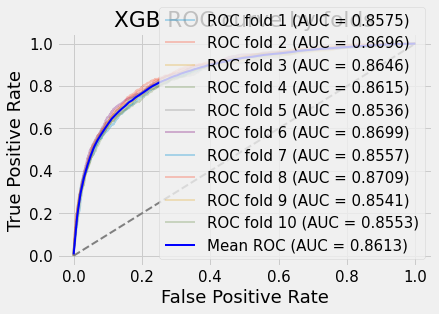

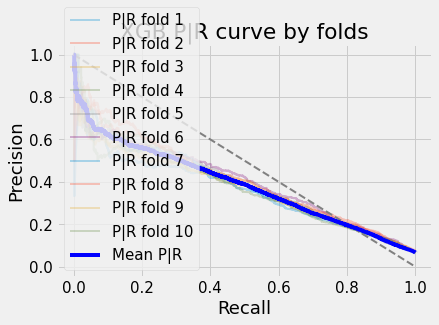

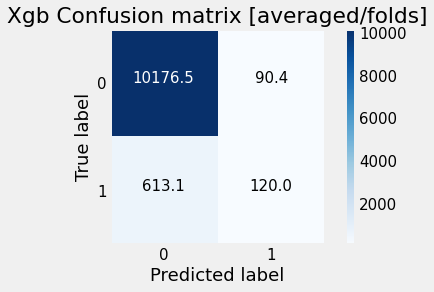

In [57]:
from sklearn.metrics import precision_score, recall_score, confusion_matrix, accuracy_score, roc_auc_score, f1_score, roc_curve, auc,precision_recall_curve
param_xgb = {
            'n_jobs' : -1, 'n_estimators' : 500, 'seed' : 4040,
            'random_state':404, 'eval_metric':'auc', 'shuffle' : False }
# Test data
sub_df = pd.read_csv('teste.csv')
preds_xgb = gradient_boosting_model(param_xgb, 10, sub_df, 'XGB')



## Gradient Boosting Model function

ing] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

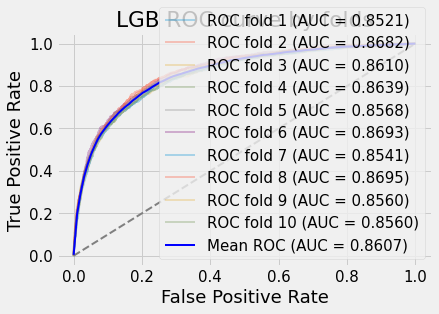

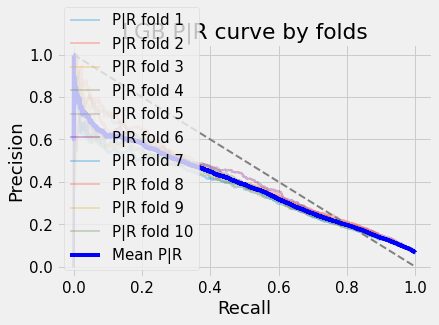

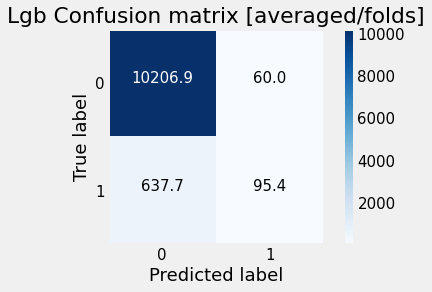

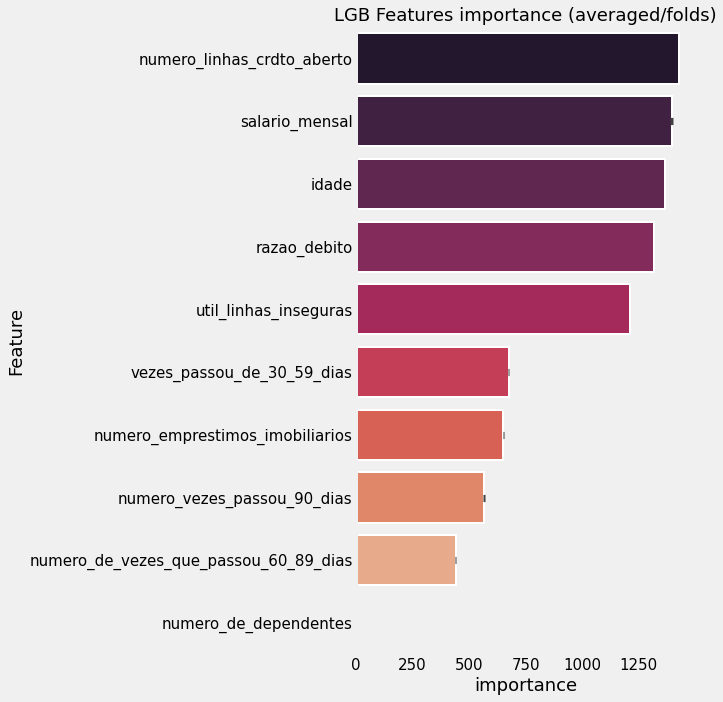

In [60]:
param_lgb = {
    'bagging_freq': 5,
    'bagging_fraction': 0.4,
    'boost_from_average':'false',
    'boost': 'gbdt',
    'feature_fraction': 0.05,
    'learning_rate': 0.01,
    'max_depth': -1,  
    'metric':'auc',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 13,
    'num_threads': 8,
    'tree_learner': 'serial',
    'class_weight':'unbalanced',
    'scale_pos_weight':positive_weight,    
    'objective': 'binary', 
    'verbosity': 1
}

# Test data
sub_df = pd.read_csv('teste.csv')

predictions = gradient_boosting_model(param_lgb, 10, sub_df, 'LGB')
sub_df["inadimplente"] = predictions.round()
sub_df["inadimplente score"] = predictions

#### Creation final test dataset

In [61]:
sub_df.to_csv("teste_final.csv", index=False)
sub_df.head()

,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes,inadimplente,inadimplente score
0,0.025849,62,0,0.081775,8180.0,3,0,2,0,0.0,0.0,0.017134
1,0.667083,55,0,0.153112,2200.0,3,0,0,0,0.0,0.0,0.052568
2,0.007093,44,0,0.148800,7499.0,20,0,1,0,0.0,0.0,0.023421
3,0.091213,54,0,0.351635,5900.0,15,0,1,1,0.0,0.0,0.062035
4,0.112680,54,0,0.065959,2167.0,3,0,0,0,0.0,0.0,0.032005


### Defaulting-Score for customers

In [62]:
def severity_validation(df):
    df['defaulting-score'] = "None"
    for i, row in df.iterrows():
        if row['inadimplente'] <0.5:
            df['defaulting-score'][i] = "low-defaulting-score"
        elif row['inadimplente'] <=0.75:
            df['defaulting-score'][i] = "medium-defaulting-score" 
        else:
            df['defaulting-score'][i] = "high-defaulting-score" 
    return df

customer_df= pd.DataFrame(predictions, columns=['inadimplente'])

customer_score=severity_validation(customer_df)
customer_score['inadimplente']
q50, q25 = np.percentile(customer_score['inadimplente'], [50 ,25])
q75, q25 = np.percentile(customer_score['inadimplente'], [75 ,25])
q100, q75 = np.percentile(customer_score['inadimplente'], [100 ,75])

iqr_50 = q50 - q25
iqr_75 = q75 - q50
iqr_100 = q100 - q75
iqr_75_25 = q75 - q25

/home/tik/chal/dataminer/venv/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/home/tik/chal/dataminer/venv/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/home/tik/chal/dataminer/venv/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [63]:
customer_score['inadimplente result'] = predictions.round()
print("minimum defaulting prob ",customer_score[customer_score['defaulting-score']=='high-defaulting-score']['inadimplente'].min())
print("maximum defaulting prob ",customer_score[customer_score['defaulting-score']=='high-defaulting-score']['inadimplente'].max())

customer_score[customer_score['defaulting-score']=='high-defaulting-score'].head(10)

minimum defaulting prob  0.7512403201601849
maximum defaulting prob  0.9158799967915462


,inadimplente,defaulting-score,inadimplente result
682,0.772712,high-defaulting-score,1.0
829,0.771704,high-defaulting-score,1.0
1017,0.820073,high-defaulting-score,1.0
1239,0.840695,high-defaulting-score,1.0
1324,0.826240,high-defaulting-score,1.0
1832,0.802446,high-defaulting-score,1.0
2244,0.756652,high-defaulting-score,1.0
2375,0.807078,high-defaulting-score,1.0
2718,0.754843,high-defaulting-score,1.0
2829,0.773518,high-defaulting-score,1.0


Now we have how to identify high-defaulting customers, the customer can be assigned a "defaulting-score" based on the predicted label such that:

- Low-defaulting-score for Customers with label < 0.50
- Medium-defaulting-score Score for Customers with label between 0.5 and 0.75
- High-defaulting-score Score for Customers with label > 0.75

### Factory Analysis in defaulting customers


In [64]:
# Install library 
!pip install factor_analyzer
# import factor analyzer library
from factor_analyzer import FactorAnalyzer

You should consider upgrading via the '/home/tik/chal/dataminer/venv/bin/python -m pip install --upgrade pip' command.


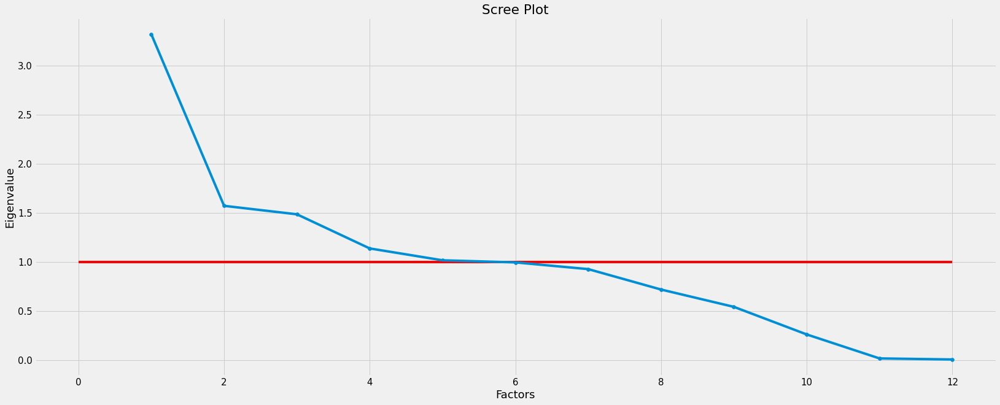

In [66]:
fa = FactorAnalyzer()
fa.fit(sub_df, 10)

ev, v = fa.get_eigenvalues()

# Create scree plot using matplotlib
plt.figure(figsize=(25,10))
plt.scatter(range(1,sub_df.shape[1]+1),ev)
plt.plot(range(1,sub_df.shape[1]+1),ev)
plt.hlines(1, 0, sub_df.shape[1], colors='r')
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

3 factors

In [67]:
print ('Perform Factor Analysis')
fa = FactorAnalyzer(n_factors=3, rotation='varimax')
fa.fit(sub_df)
loads = fa.loadings_
loads = pd.DataFrame(loads, index=sub_df.T.index)

Perform Factor Analysis


Heatmap of loadings


<AxesSubplot:>

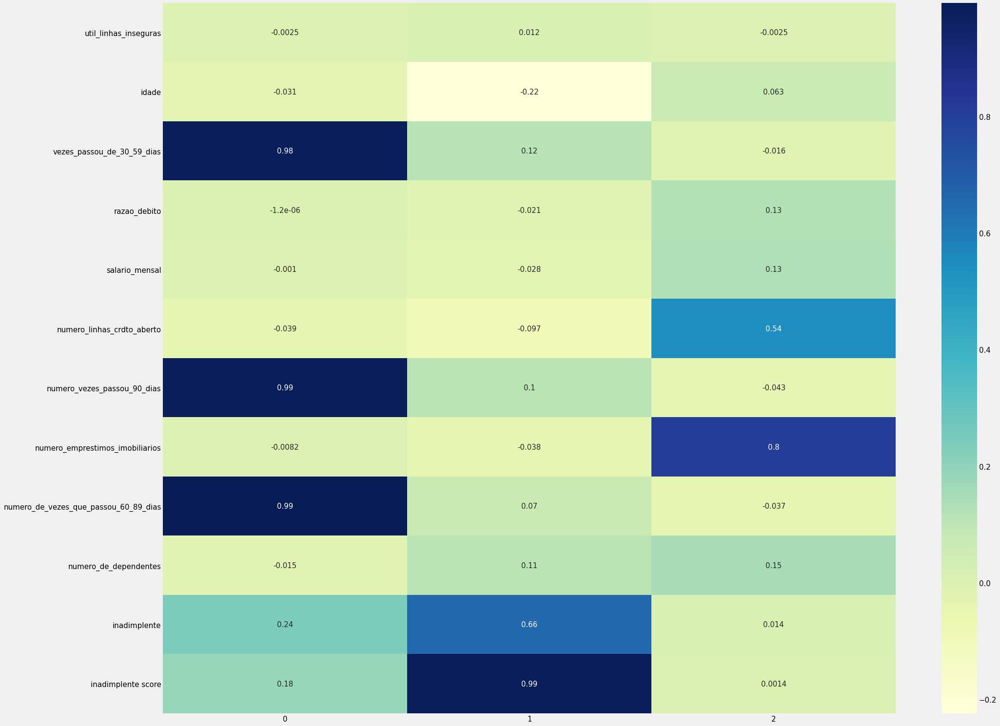

In [68]:
print('Heatmap of loadings')
plt.figure(figsize=(30,25))
sns.heatmap(loads, annot=True, cmap="YlGnBu")

### Factors 
The factors represents high correlated variables. We just considered factor loadings >35 in each factor. 
Let's analyze defaulting clientes and group them by highest scores(factor) for each of it.

- factor 1 (**client delaying payment.**) - vezes_passou_de_30_59_dias, numero_vezes_passou_90_dias, numero_de_vezes_que_passou_60_89_dias.
- factor 2 (**client with many open loans**) - numero_linhas_crdto_aberto,numero_emprestimos_imobiliarios.
- factor 3 (**young client with few dependents**) - idade, numero_de_dependentes.


In [69]:
print(test)

[[5.09756015e-07 5.68807339e-01 0.00000000e+00 ... 3.70370370e-02
  0.00000000e+00 0.00000000e+00]
 [1.31553843e-05 5.04587156e-01 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [1.39869981e-07 4.03669725e-01 0.00000000e+00 ... 1.85185185e-02
  0.00000000e+00 0.00000000e+00]
 ...
 [1.61265477e-05 6.42201835e-01 0.00000000e+00 ... 3.70370370e-02
  0.00000000e+00 0.00000000e+00]
 [2.09313927e-06 5.87155963e-01 2.04081633e-02 ... 7.40740741e-02
  0.00000000e+00 0.00000000e+00]
 [1.97207521e-05 2.56880734e-01 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


In [70]:
def score_factor1(df, df_factor_analysis, target, name_target):
    df['score_factor1_target'] = df[df['inadimplente']==target]['vezes_passou_de_30_59_dias'] * df_factor_analysis.T['vezes_passou_de_30_59_dias'][0] \
    + df[df[name_target]==target]['numero_vezes_passou_90_dias'] * df_factor_analysis.T['numero_vezes_passou_90_dias'][0] \
    + df[df[name_target]==target]['numero_de_vezes_que_passou_60_89_dias'] * df_factor_analysis.T['numero_de_vezes_que_passou_60_89_dias'][0]        

score_factor1(sub_df, loads, 0, 'inadimplente')       
score_factor1(sub_df, loads, 1, 'inadimplente')


In [71]:
def score_factor2(df, df_factor_analysis, target, name_target):
    df['score_factor2_target'] = df[df['inadimplente']==target]['numero_linhas_crdto_aberto'] * df_factor_analysis.T['numero_linhas_crdto_aberto'][1] \
    + df[df[name_target]==target]['numero_emprestimos_imobiliarios'] * df_factor_analysis.T['numero_emprestimos_imobiliarios'][1]  

score_factor2(sub_df, loads, 0, 'inadimplente')       
score_factor2(sub_df, loads, 1, 'inadimplente')


In [72]:
def score_factor3(df, df_factor_analysis, target, name_target):
    df['score_factor3_target'] = df[df['inadimplente']==target]['idade'] * df_factor_analysis.T['idade'][2] \
    + df[df[name_target]==target]['numero_de_dependentes'] * df_factor_analysis.T['numero_de_dependentes'][2]   

score_factor3(sub_df, loads, 0, 'inadimplente')       
score_factor3(sub_df, loads, 1, 'inadimplente')


The Clients with high 'inadimplente score' and high score for the Factor 1.

In [73]:
sub_df

,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes,inadimplente,inadimplente score,score_factor1_target,score_factor2_target,score_factor3_target
0,0.025849,62,0,0.081775,8180.0,3,0,2,0,0.0,0.0,0.017134,NaN,NaN,NaN
1,0.667083,55,0,0.153112,2200.0,3,0,0,0,0.0,0.0,0.052568,NaN,NaN,NaN
2,0.007093,44,0,0.148800,7499.0,20,0,1,0,0.0,0.0,0.023421,NaN,NaN,NaN
3,0.091213,54,0,0.351635,5900.0,15,0,1,1,0.0,0.0,0.062035,NaN,NaN,NaN
4,0.112680,54,0,0.065959,2167.0,3,0,0,0,0.0,0.0,0.032005,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,0.000000,68,1,0.062858,10833.0,9,1,0,0,0.0,0.0,0.088930,NaN,NaN,NaN
39996,0.061117,84,0,0.013598,8456.0,7,0,0,0,0.0,0.0,0.011475,NaN,NaN,NaN
39997,0.817745,70,0,0.663056,6000.0,17,0,2,0,0.0,0.0,0.056009,NaN,NaN,NaN
39998,0.106139,64,2,0.865438,5045.0,12,0,4,0,0.0,0.0,0.087426,NaN,NaN,NaN


In [74]:
sub_df.columns

Index(['util_linhas_inseguras', 'idade', 'vezes_passou_de_30_59_dias',
       'razao_debito', 'salario_mensal', 'numero_linhas_crdto_aberto',
       'numero_vezes_passou_90_dias', 'numero_emprestimos_imobiliarios',
       'numero_de_vezes_que_passou_60_89_dias', 'numero_de_dependentes',
       'inadimplente', 'inadimplente score', 'score_factor1_target',
       'score_factor2_target', 'score_factor3_target'],
      dtype='object')

In [75]:
sub_df[['score_factor1_target', 'inadimplente score' ]].sort_values(by=['score_factor1_target', 'inadimplente score'],ascending=False).head(10)

,score_factor1_target,inadimplente score
29725,290.472626,0.618606
25532,290.472626,0.615741
13298,290.472626,0.611458
10745,290.472626,0.605052
7051,290.472626,0.600316
33632,290.472626,0.598507
4468,290.472626,0.597719
25378,290.472626,0.597338
39078,290.472626,0.590493
13345,290.472626,0.583652


The clientes  with high 'inadimplente score' and high score for the Factor 2.

In [76]:
sub_df[['score_factor2_target', 'inadimplente score' ]].sort_values(by=['score_factor2_target', 'inadimplente score'],ascending=False).head(10)

,score_factor2_target,inadimplente score
1324,-0.0,0.826240
4758,-0.0,0.808899
1457,-0.0,0.719928
20602,-0.0,0.645427
23335,-0.0,0.639024
29725,-0.0,0.618606
25532,-0.0,0.615741
13298,-0.0,0.611458
23770,-0.0,0.609051
10745,-0.0,0.605052


The clients with high 'inadimplente score' and high score for the Factor 3.

In [77]:
sub_df[['score_factor3_target', 'inadimplente score' ]].sort_values(by=['score_factor3_target', 'inadimplente score'],ascending=False).head(10)

,score_factor3_target,inadimplente score
5366,5.636305,0.878293
6036,5.359749,0.673588
26207,5.131858,0.560230
5921,4.918358,0.670927
6538,4.753523,0.729455
6439,4.749073,0.527915
34408,4.690467,0.607135
5812,4.666135,0.618568
23162,4.603079,0.704290
26457,4.603079,0.681054


# End of Credit Score Notebook

In [78]:
 # Conclusion



 ### The project was initiated on 19:30 h of 04-05-21. As the excutor has only 05 hours per day to excute he project the inital time planing was done according to:
### 
### 
###  The Deadline for the conclusio is: 19:00 hours of may, 7 th of 2021.
### Human Resources: 5 hours per day, this is: 15:00 hours of me.
### Tools: Personal Notebok and open source libraries.
### 
### Within only 15 hours of project and in a 3 days time basis the project shall be conducted within the Minimum Vaiable Product model, doing the essentially necessary and wraping everything in the most dry way, so the final client (reviewer) shall run and receive what was required. Somethings will fall short to a deployable infrastructute but nevertheless it should proove that the proposed model generate good results. 
### 
### <i>First 5 hours: Planning, Data Exploration And Data Cleaning.
###     Should explore, view and clean the current.
### Second 5 hours: Feature Engineering and Model Aplication
###     Should create new features to better serve Machine Learning Models, Apply at least 3 models to the project. 
### Last 5 Hours: Model Avaliation and Presentation:</i>
### 
### But by the final stage of the second day of the project, while searching for ways to transform the code in a DRY way, Projects very similar were found. As the time schedule was tight and the amount o time was limited the resources should no be ignored. This is stated to declare this notebook took inspiration in others done before.
### This notebook can be heavily improved to be used in production ambient with tools as kedro, airflow and dbt.
### The development of this same notebook inside kedro templates can heavily improve the value of the code as the format as is
### will need much refactoring in order to be applied to a real production ambient. And such change shall be done to this code with the apropriate amount of time.
 